# Plot notebook for the regression of the SSTA on the NTA index. 

- figure 1: the regression coefficient of the SSTA on the NTA index for ERSST, HadISST, and CMIP-MMM. 
- figure S2: the regression coefficient of the SSTA on the NTA index for CMIP models.



In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.patches as mpatches
import numpy as np
from scipy import stats
import pandas as pd 
from itertools import cycle
from cmip_postprocess import *
from cmip_plot import plot_all_reg_cor_map
import warnings 
warnings.filterwarnings('ignore')

2025-01-20 14:09:40.410147


In [2]:
# Path to the data
SSTA_PATH = '../data/processed/SSTA/'
SSTA_INDEX_PATH = '../data/processed/SSTA_INDEX/'
source_id = '../data/raw/source_id.txt'
OUT_REG_PATH = '../data/processed/regression/'
OUT_FIG_PATH = '../results/figures/'

In [3]:
# Load the data
lpf_ssta = load_from_pickle(SSTA_PATH + 'lpf_ssta.pkl')
nta_index = load_from_pickle(SSTA_INDEX_PATH + 'nta_ssta.pkl')

In [5]:
################## Plot ###########################
def plot_regression_correlation_map(ax, data, variable, title, vmin=-0.1, vmax=0.1):
    # Extract the data to be plotted
    data_to_plot = data[variable]
    
    # Define a significance level
    # alpha = 0.1  # Consider making this more stringent if you want fewer dots
    r_threshold = 0.621489 # reference correlation based on the pearson correlation table (df=780/120, alpha=0.1)
    
    # Create a mask for significant values
    # significant_mask = data['p_value'] < alpha
    significant_mask = abs(data['r_value']) >= r_threshold
    
    # Plot the data
    im = ax.pcolormesh(data_to_plot['lon'], data_to_plot['lat'], data_to_plot,
                       transform=ccrs.PlateCarree(), cmap='RdBu_r', vmin=vmin, vmax=vmax)
    
    # Add stippling where the values are significant
    stipple_lons, stipple_lats = np.meshgrid(data_to_plot['lon'], data_to_plot['lat'])
    
    # Spatial thinning of significant points (e.g., every 5th point)
    thinning_factor = 6
    thin_mask = (significant_mask[::thinning_factor, ::thinning_factor])
    thin_stipple_lons = stipple_lons[::thinning_factor, ::thinning_factor]
    thin_stipple_lats = stipple_lats[::thinning_factor, ::thinning_factor]
    
    ax.scatter(thin_stipple_lons[thin_mask], thin_stipple_lats[thin_mask], 
               color='k', marker='.', s=10, alpha=1, transform=ccrs.PlateCarree())  # Adjust size `s` and transparency `alpha` as needed
    
    # Add coastlines for context
    ax.coastlines()
    
    # Set title for the subplot
    ax.set_title(title)
    
    # Add gridlines and labels
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1, color='gray', alpha=0.4, linestyle='--')
    gl.top_labels = False  # Disable labels at the top
    gl.right_labels = False  # Disable labels on the right
    
    # Draw a box for 'cti'
    cti_box = mpatches.Rectangle((180, -6), 90, 12, fill=False, edgecolor='black', linewidth=2, transform=ccrs.PlateCarree())
    ax.add_patch(cti_box)
    
    return im


# Create figure and axes objects for the subplots
def plot_all_reg_cor_map(regression_results, var, titles, suptitle='Regression Maps for MMF and E3SM Cloud Data with AMO Index', \
                         label='Regression Coefficient $(^\circ C)$',vmin=-0.1, vmax=0.1, nrows=3,ncols=3, savefig=True, \
                         outpath='./paper_figures/', out_name=None, figsize=(18,6)):
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize,
                            subplot_kw={'projection': ccrs.Robinson(central_longitude=180)}, dpi=300)
    axes = axes.flatten()  # Flatten the 2D array of axes for easy iteration

    # Variable to hold the last 'im' object for colorbar creation
    last_im = None

    # Loop over axes and regression results to create each subplot
    for ax, ds, title in zip(axes, regression_results, titles):
        # 'ds' is assumed to be an xarray.Dataset with 'slope' and 'p_value' data variables
        last_im = plot_regression_correlation_map(ax, ds, var, title, vmin=vmin, vmax=vmax)

    # ... (the rest of the plotting code including suptitle, tight_layout, colorbar, etc.)
    # If there are any remaining axes not used, hide them
    for i in range(len(regression_results), nrows * ncols):
        fig.delaxes(axes[i])

    # Add an overall title
    plt.suptitle(suptitle)

    # Adjust layout
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the rect so the suptitle fits

    # Add a colorbar at the bottom of the subplots
    cbar = fig.colorbar(last_im, ax=axes.ravel().tolist(), orientation='horizontal', 
                        fraction=0.025, pad=0.1, aspect=50)
    cbar.set_label(label)
    if savefig:
        plt.savefig(outpath+out_name)
    plt.show()

## 1. calculate the ssta regression on nta index for each model

In [7]:
# Create a dictionary to hold the regression results for each model
regression_lpf_ssta_nta = {}

# Loop over each model and calculate the regression
for model, nta_ds, ssta_ds in zip(lpf_ssta.keys(), 
                                 nta_index['lpf_data'].values(), 
                                 lpf_ssta.values()):
    model = model.split('.')[0] # get cmip model names
    print('Starting regression for', model)
    regression_lpf_ssta_nta[model] = calculate_regression_vectorize(nta_ds, 
                                                            ssta_ds)
   

Starting regression for CESM2-WACCM
Starting regression for CESM2-WACCM-FV2
Starting regression for CESM2-FV2
Starting regression for CESM2
Starting regression for TaiESM1
Starting regression for GISS-E2-1-H
Starting regression for BCC-ESM1
Starting regression for NESM3
Starting regression for GISS-E2-1-G-CC
Starting regression for CanESM5
Starting regression for BCC-CSM2-MR
Starting regression for GISS-E2-1-G
Starting regression for MPI-ESM-1-2-HAM
Starting regression for MPI-ESM1-2-LR
Starting regression for NorESM2-MM
Starting regression for IITM-ESM
Starting regression for MRI-ESM2-0
Starting regression for CMCC-CM2-SR5
Starting regression for FGOALS-g3
Starting regression for ACCESS-CM2
Starting regression for MPI-ESM1-2-HR
Starting regression for CAMS-CSM1-0
Starting regression for AWI-ESM-1-1-LR
Starting regression for CMCC-ESM2
Starting regression for SAM0-UNICON
Starting regression for MIROC6
Starting regression for CMCC-CM2-HR4
Starting regression for E3SM-MMF
Starting regres

## 2. order the model based on the model_ranking.csv

In [10]:
## load the model_ranking.csv, this model_ranking is calculate in the figure4.ipynb
model_ranking = pd.read_csv('../results/tables/model_ranking.csv')

# Sort model_ranking by Distance in descending order
model_ranking = model_ranking.sort_values('Distance', ascending=True)

# Create ordered dictionary
regression_lpf_ssta_nta_ordered = {}

# First add observational data
if 'ERSST' in regression_lpf_ssta_nta:
    regression_lpf_ssta_nta_ordered['ERSST'] = regression_lpf_ssta_nta['ERSST']
if 'HadISST' in regression_lpf_ssta_nta:
    regression_lpf_ssta_nta_ordered['HadISST'] = regression_lpf_ssta_nta['HadISST']

# Add model data in descending order of Distance
for model in model_ranking['Unnamed: 0']:
    if model in regression_lpf_ssta_nta:
        regression_lpf_ssta_nta_ordered[model] = regression_lpf_ssta_nta[model]
# Replace original dictionary with ordered one
regression_lpf_ssta_nta = regression_lpf_ssta_nta_ordered

## 3. Plot the regression maps 

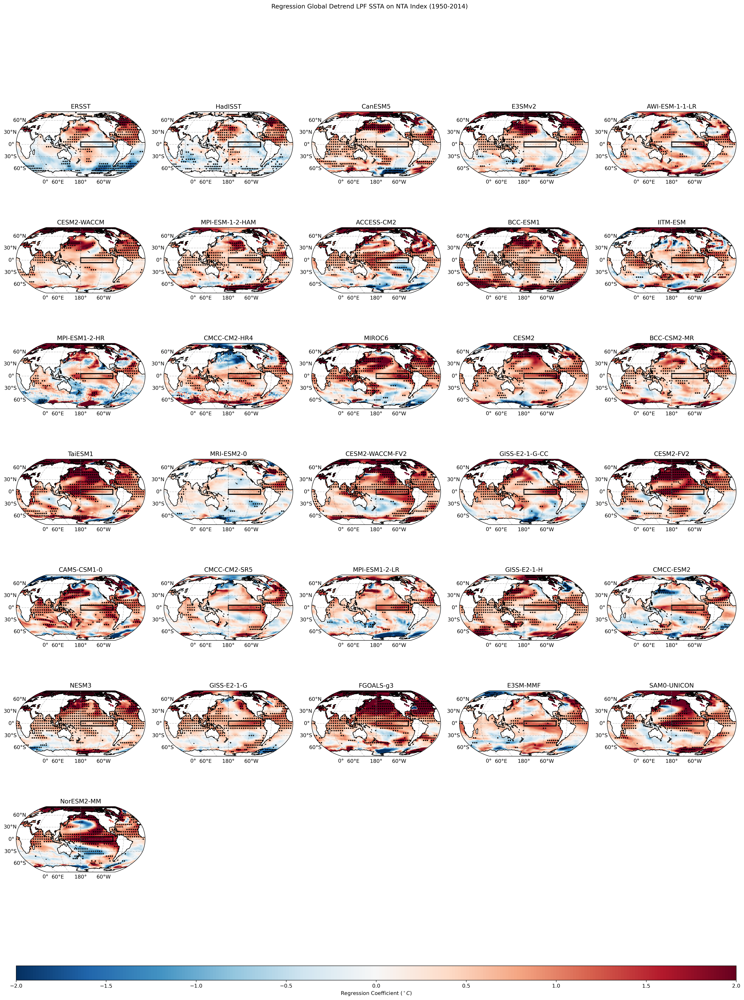

In [12]:

# model_names = [model.split('.')[0] for model in list(lpf_ssta.keys())]
model_names = list(regression_lpf_ssta_nta.keys())
# excluded_models = ['E3SM-MMF', 'E3SMv2', 'HadISST', 'ERSST']
# filtered_model_names = [name for name in model_names if name not in excluded_models]
filtered_regression_results = [result for name, result in zip(model_names, regression_lpf_ssta_nta.values())]



suptitles = ['Regression Global Detrend LPF SSTA on NTA Index (1950-2014)', 'Correlation Global Detrend LPF SSTA on NTA Index (1950-2014)']
labels = ['Regression Coefficient $(^\circ C)$', 'Correlation Coefficient']
vmins, vmaxs  = [-2, -0.1], [2, 0.1]
vars = ['slope', 'r_value']

# Adjust layout parameters
ncols = 5  # Reduce number of columns
nrows = int(len(model_names) / ncols + (len(model_names) % ncols > 0))
figsize = (20, 4 * nrows)  # Adjust figure size for better visibility

# In the plotting function
plot_all_reg_cor_map(
    regression_results=filtered_regression_results,
    var=vars[0],
    titles=model_names,
    vmin=vmins[0],
    vmax=vmaxs[0],
    suptitle=suptitles[0],
    label=labels[0],
    nrows=nrows,
    ncols=ncols,
    figsize=figsize,
    outpath=OUT_FIG_PATH,
    out_name='figure_s1_lpf_correction_sst_nta_map_all.png'
)

## 4. calculate the ensemble mean 

In [1]:
# calculate the ensemble mean
# for models not in the last four 
cmip_mmm_reg_lpf_ssta_nta = 0

for model, data in regression_lpf_ssta_nta.items():
    if model in ['E3SM-MMF', 'E3SMv2', 'HadISST', 'ERSST']:
        continue
    cmip_mmm_reg_lpf_ssta_nta += data['slope']


cmip_mmm_reg_lpf_ssta_nta = cmip_mmm_reg_lpf_ssta_nta/(len(regression_lpf_ssta_nta)-4)


NameError: name 'regression_lpf_ssta_nta' is not defined

## 5. Plot the ensemble mean regression results

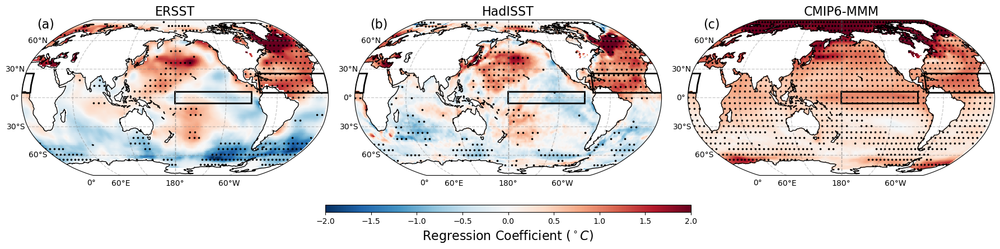

In [14]:

######################### Mask Threshold ##################################
r_threshold = 0.621489  # reference correlation based on the Pearson correlation table (df=780/120, alpha=0.1)

# Function to calculate the t-value and significance for CMIP-MMM
def calculate_significance(models_data):
    r_values = np.array([data['r_value'] for model, data in models_data.items() if model not in ['E3SM-MMF', 'E3SMv2', 'HadISST', 'ERSST']])
    
    mean_correlation = np.mean(r_values, axis=0)
    std_dev = np.std(r_values, axis=0, ddof=1)
    n = len(r_values)
    standard_error = std_dev / np.sqrt(n)
    t_value = mean_correlation / standard_error
    degrees_of_freedom = n - 1
    alpha = 0.10
    critical_t_value = stats.t.ppf(1 - alpha / 2, degrees_of_freedom)
    significance_mask = abs(t_value) > critical_t_value
    return significance_mask

# Calculate significance mask for CMIP-MMM
cmip_mmm_significance_mask = calculate_significance(regression_lpf_ssta_nta)

############################### Plot Mask ###############################
# Function to create significant mask and plot the dots
def plot_significant_dots(ax, data, lons, lats, threshold, thinning_factor=6):
    significant_mask = abs(data['r_value']) >= threshold
    stipple_lons, stipple_lats = np.meshgrid(lons, lats)
    thin_mask = significant_mask[::thinning_factor, ::thinning_factor]
    thin_stipple_lons = stipple_lons[::thinning_factor, ::thinning_factor]
    thin_stipple_lats = stipple_lats[::thinning_factor, ::thinning_factor]
    ax.scatter(thin_stipple_lons[thin_mask], thin_stipple_lats[thin_mask], 
               color='k', marker='.', s=10, alpha=1, transform=ccrs.PlateCarree())  # Adjust size `s` and transparency `alpha` as needed

# Function to create significant mask and plot the dots for CMIP_MMM
def plot_significant_dots_cmip_mmm(ax, data, lons, lats, significance_mask, thinning_factor=6):
    stipple_lons, stipple_lats = np.meshgrid(lons, lats)
    thin_mask = significance_mask[::thinning_factor, ::thinning_factor]
    thin_stipple_lons = stipple_lons[::thinning_factor, ::thinning_factor]
    thin_stipple_lats = stipple_lats[::thinning_factor, ::thinning_factor]
    ax.scatter(thin_stipple_lons[thin_mask], thin_stipple_lats[thin_mask], 
               color='k', marker='.', s=10, alpha=1, transform=ccrs.PlateCarree())  # Adjust size `s` and transparency `alpha` as needed

# Create figure and axes objects for the subplots
fig, axe = plt.subplots(1, 3, figsize=(18, 6), subplot_kw={'projection': ccrs.Robinson(central_longitude=180)})

axes = axe.flatten()  # Flatten the 2D array of axes for easy iteration

# please plot NTA and CTI regions in the subplots


# Plot the ensemble mean regression results
im = regression_lpf_ssta_nta['ERSST']['slope'].plot(ax=axes[0], transform=ccrs.PlateCarree(), cmap='RdBu_r', vmin=-2, vmax=2, add_colorbar=False)
im1 = regression_lpf_ssta_nta['HadISST']['slope'].plot(ax=axes[1], transform=ccrs.PlateCarree(), cmap='RdBu_r', vmin=-2, vmax=2, add_colorbar=False)
im2 = cmip_mmm_reg_lpf_ssta_nta.plot(ax=axes[2], transform=ccrs.PlateCarree(), cmap='RdBu_r', vmin=-2, vmax=2, add_colorbar=False)
# im3 = regression_lpf_ssta_nta['E3SM-MMF']['slope'].plot(ax=axes[3], transform=ccrs.PlateCarree(), cmap='RdBu_r', vmin=-3, vmax=3, add_colorbar=False)
# im4 = regression_lpf_ssta_nta['E3SMv2']['slope'].plot(ax=axes[4], transform=ccrs.PlateCarree(), cmap='RdBu_r', vmin=-3, vmax=3, add_colorbar=False)

# Add coastlines and gridlines for context
for ax in axes:
    ax.coastlines()
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1, color='gray', alpha=0.4, linestyle='--')
    gl.top_labels = False  # Disable labels at the top
    gl.right_labels = False  # Disable labels on the right

# Set titles for the subplots
# titles = ['ERSST', 'HadISST', 'CMIP6-MMM', 'E3SM-MMF', 'E3SMv2']
titles = ['ERSST', 'HadISST', 'CMIP6-MMM']
for i, title in enumerate(titles):
    axes[i].set_title(title, fontsize=16)

# Remove extra subplot
    # for i in range(5, 6):
    #     fig.delaxes(axes[i])
# please include text (a), (b), (c) in the subplot. pelase change the place of the text to the top left corner of the subplot   
axes[0].text(0.05, 0.95, '(a)', transform=axes[0].transAxes, fontsize=16, )
axes[1].text(0.05, 0.95, '(b)', transform=axes[1].transAxes, fontsize=16, )
axes[2].text(0.05, 0.95, '(c)', transform=axes[2].transAxes, fontsize=16, )

# Plot significant dots for each model except CMIP-MMM
lon, lat = regression_lpf_ssta_nta['ERSST']['lon'], regression_lpf_ssta_nta['ERSST']['lat']
plot_significant_dots(axes[0], regression_lpf_ssta_nta['ERSST'], lon, lat, r_threshold)
plot_significant_dots(axes[1], regression_lpf_ssta_nta['HadISST'], regression_lpf_ssta_nta['HadISST'].lon, regression_lpf_ssta_nta['HadISST'].lat, r_threshold)
plot_significant_dots_cmip_mmm(axes[2], cmip_mmm_reg_lpf_ssta_nta, lon, lat, cmip_mmm_significance_mask)
# plot_significant_dots(axes[3], regression_lpf_ssta_nta['E3SM-MMF'], lon, lat, r_threshold)
# plot_significant_dots(axes[4], regression_lpf_ssta_nta['E3SMv2'], lon, lat, r_threshold)

# regions = {
#     'amo': ([280, 360], [0, 65]),
#     'nta': ([280, 360], [5, 25]),
#     'cti': ([180, 270], [-6, 6]),
# }

# please add the NTA and CTI regions in the subplots
cti_box_0 = mpatches.Rectangle((180, -6), 90, 12, fill=False, edgecolor='black', linewidth=2, transform=ccrs.PlateCarree())
cti_box_1 = mpatches.Rectangle((180, -6), 90, 12, fill=False, edgecolor='black', linewidth=2, transform=ccrs.PlateCarree())
cti_box_2 = mpatches.Rectangle((180, -6), 90, 12, fill=False, edgecolor='black', linewidth=2, transform=ccrs.PlateCarree())

nta_box_0 = mpatches.Rectangle((280, 5), 90, 20, fill=False, edgecolor='black', linewidth=2, transform=ccrs.PlateCarree())
nta_box_1 = mpatches.Rectangle((280, 5), 90, 20, fill=False, edgecolor='black', linewidth=2, transform=ccrs.PlateCarree())
nta_box_2 = mpatches.Rectangle((280, 5), 90, 20, fill=False, edgecolor='black', linewidth=2, transform=ccrs.PlateCarree())

axes[0].add_patch(cti_box_0)
axes[1].add_patch(cti_box_1)
axes[2].add_patch(cti_box_2)
axes[0].add_patch(nta_box_0)
axes[1].add_patch(nta_box_1)
axes[2].add_patch(nta_box_2)

# Add an overall title
# plt.suptitle('Correlation Coefficient of Low-Pass-Filtered SSTA on NTA Index', fontsize=18)

# Adjust layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the rect so the suptitle fits

# Add a colorbar at the bottom of the subplots
cbar = fig.colorbar(im, ax=axes.ravel().tolist(), orientation='horizontal', 
                    fraction=0.025, pad=0.1, aspect=50)

# label = 'Correlation Coefficient with Celsius degree'
label = 'Regression Coefficient $(^\circ C)$'
cbar.set_label(label, fontsize=16)

plt.savefig('./paper_figures/Fig1_Correlation_Coefficient_of_Low_Pass_Filtered_SSTA_on_NTA_Index_(1950-2015).png')
plt.show()

